<a href="https://colab.research.google.com/github/taresh18/Image-Colorization/blob/main/ImColor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import time
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
from PIL import Image
from pathlib import Path
from skimage.color import rgb2lab, lab2rgb

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#device = torch.device("mps")
np.random.seed(123)

In [2]:
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from spz.utils import*
from spz.models_utils import*


In [3]:
data_path = '../data/coco2017/train2017'
print(os.getcwd())

/Users/macbookpro/Documents/vscode_Projects/image-colorization/notebooks


In [19]:
# randomly selecting 10k images (8k training and 2k validation)
img_paths = glob.glob(data_path + "/*.jpg") 
print(len(img_paths))
img_paths_sub = np.random.choice(img_paths, 10000, replace=False) 
rand_ids = np.random.permutation(10000)
train_ids = rand_ids[:8000] 
train_paths = img_paths_sub[train_ids]
val_ids = rand_ids[8000:] 
val_paths = img_paths_sub[val_ids]
print("Train size: ", len(train_paths))
print("Val size: ", len(val_paths))

106072 <class 'list'>
Train size:  8
Val size:  2
['../data/coco2017/train2017/000000002001.jpg'
 '../data/coco2017/train2017/000000185681.jpg'
 '../data/coco2017/train2017/000000542342.jpg'
 '../data/coco2017/train2017/000000182112.jpg'
 '../data/coco2017/train2017/000000130706.jpg'
 '../data/coco2017/train2017/000000333694.jpg'
 '../data/coco2017/train2017/000000533599.jpg'
 '../data/coco2017/train2017/000000271148.jpg'
 '../data/coco2017/train2017/000000465566.jpg'
 '../data/coco2017/train2017/000000017488.jpg'] <class 'numpy.ndarray'>
[1 9 0 4 7 6 2 8 5 3] <class 'numpy.ndarray'>
[1 9 0 4 7 6 2 8] <class 'numpy.ndarray'>
['../data/coco2017/train2017/000000185681.jpg'
 '../data/coco2017/train2017/000000017488.jpg'
 '../data/coco2017/train2017/000000002001.jpg'
 '../data/coco2017/train2017/000000130706.jpg'
 '../data/coco2017/train2017/000000271148.jpg'
 '../data/coco2017/train2017/000000533599.jpg'
 '../data/coco2017/train2017/000000542342.jpg'
 '../data/coco2017/train2017/000000465

In [20]:
import os
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def filter_corrupted_images(file_paths):
    valid_images = []
    corrupted_images = []

    for path in file_paths:
        try:
            img = Image.open(path)
            img.verify()  # Verify if the image is valid
            valid_images.append(path)  # Add valid images to the list
        except (IOError, SyntaxError) as e:
            corrupted_images.append(path)  # Add corrupted images to the list
            print(f"Corrupted image removed: {path} - {e}")

    print(f"Total corrupted images removed: {len(corrupted_images)}")
    return valid_images

# Assuming train_paths and val_paths are defined
train_paths = filter_corrupted_images(train_paths)
val_paths = filter_corrupted_images(val_paths)

print("Updated training size:", len(train_paths))
print("Updated validation size:", len(val_paths))

Total corrupted images removed: 0
Total corrupted images removed: 0
Updated training size: 8
Updated validation size: 2


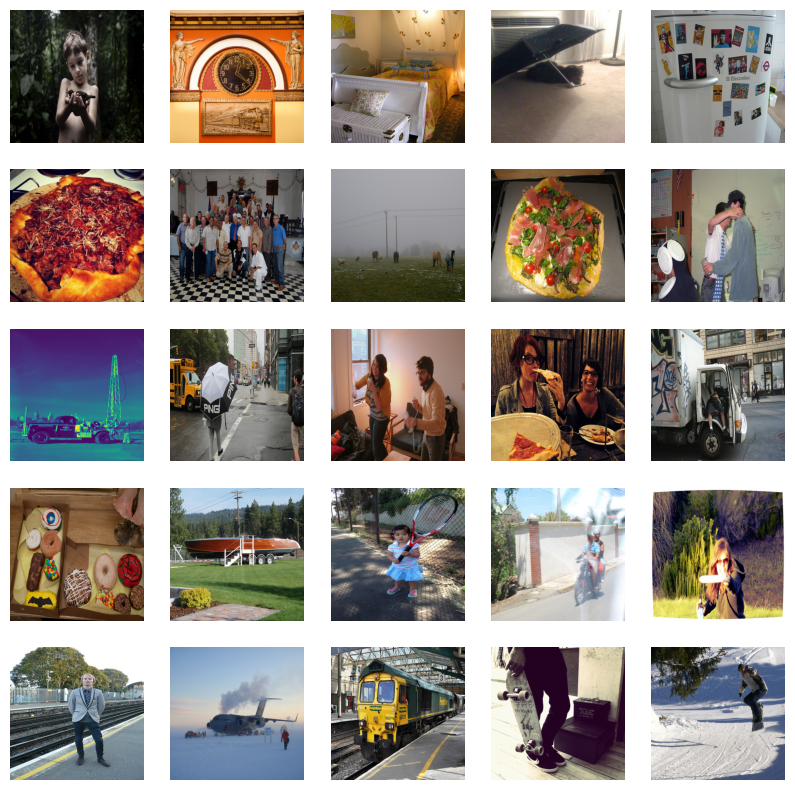

In [6]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(10, 10), facecolor='white', squeeze=True)
for ax, img_path in zip(axes.flatten(), train_paths):
    ax.imshow(Image.open(img_path), aspect='auto')
    ax.axis("off")

In [7]:
lr_G = 0.0002
lr_d = 0.0002
beta1=0.5
beta2=0.999
lamda = 100.
batch_size = 16
img_size = 256
num_epochs = 5

In [21]:
# Preparing the train and val dataloaders
train_dataset = make_data(data_path=train_paths, split='train')
val_dataset = make_data(data_path=val_paths, split='val')
train_dl = DataLoader(train_dataset, batch_size=batch_size, num_workers=4, pin_memory=True)
val_dl = DataLoader(val_dataset, batch_size=batch_size, num_workers=4, pin_memory=True)
print(len(train_dl), len(val_dl))

print(train_paths)

for data in train_dl:
    print(data)
    break

1 1
[np.str_('../data/coco2017/train2017/000000185681.jpg'), np.str_('../data/coco2017/train2017/000000017488.jpg'), np.str_('../data/coco2017/train2017/000000002001.jpg'), np.str_('../data/coco2017/train2017/000000130706.jpg'), np.str_('../data/coco2017/train2017/000000271148.jpg'), np.str_('../data/coco2017/train2017/000000533599.jpg'), np.str_('../data/coco2017/train2017/000000542342.jpg'), np.str_('../data/coco2017/train2017/000000465566.jpg')]
{'L': tensor([[[[ 0.2474,  0.0884, -0.1925,  ..., -0.8357, -0.4367, -0.4401],
          [ 0.2718, -0.0680,  0.1709,  ..., -0.8328, -0.5246, -0.6137],
          [-0.1528,  0.1708,  0.1852,  ..., -0.8131, -0.6263, -0.5207],
          ...,
          [ 0.3458,  0.3772,  0.4299,  ...,  0.0854,  0.1118,  0.0557],
          [ 0.3815,  0.4198,  0.4742,  ...,  0.1356,  0.1800,  0.1672],
          [ 0.4558,  0.4852,  0.5208,  ...,  0.1838,  0.1681,  0.1763]]],


        [[[-0.9387, -0.9379, -0.9516,  ..., -0.9828, -0.9597, -0.8073],
          [-0.9316

In [12]:
#from fastai.vision.learner import create_body
from fastai.vision.all import *
from torchvision.models.resnet import resnet34
from fastai.vision.models.unet import DynamicUnet



In [14]:
def build_generator(n_input=1, n_output=2, size=img_size):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    #device = torch.device("mps")
    backbone = create_body(resnet34(), pretrained=True, n_in=n_input, cut=-2)
    G_net = DynamicUnet(backbone, n_output, (size, size)).to(device)
    return G_net

In [11]:
def pretrain_generator(G_net, train_dl, opt, criterion, num_epochs):
    for itr in range(num_epochs):
        loss_meter = AverageMeter()
        for data in tqdm(train_dl):
            L, ab = data['L'].to(device), data['ab'].to(device)
            preds = G_net(L)
            loss = criterion(preds, ab)
            opt.zero_grad()
            loss.backward()
            opt.step()
            
            loss_meter.update(loss.item(), L.size(0))
            
        print(f"Epoch {itr + 1}/{num_epochs}")
        print(f"L1 Loss: {loss_meter.avg:.5f}")

G_net = build_generator(n_input=1, n_output=2, size=img_size)
opt = optim.Adam(G_net.parameters(), lr=0.0004)
criterion = nn.L1Loss()        
pretrain_generator(G_net, train_dl, opt, criterion, num_epochs)


100%|██████████| 500/500 [04:15<00:00,  1.95it/s]


Epoch 1/5
L1 Loss: 0.11852


100%|██████████| 500/500 [04:16<00:00,  1.95it/s]


Epoch 2/5
L1 Loss: 0.08423


100%|██████████| 500/500 [04:16<00:00,  1.95it/s]


Epoch 3/5
L1 Loss: 0.08325


100%|██████████| 500/500 [04:16<00:00,  1.95it/s]


Epoch 4/5
L1 Loss: 0.08263


100%|██████████| 500/500 [04:16<00:00,  1.95it/s]

Epoch 5/5
L1 Loss: 0.08226


In [12]:
torch.save(G_net.state_dict(), "generator.pt")

In [16]:
G_net = build_generator(n_input=1, n_output=2, size=img_size)
G_net.load_state_dict(torch.load("generator.pt", map_location=device))

/tmp/ipykernel_63670/3121891661.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  G_net.load_state_dict(torch.load("generator.pt", map_location=device))


<All keys matched successfully>

In [17]:
# Architecture of the Discriminator model (PatchGAN)
Discriminator(4)

Discriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (4): S

Initializing the model with norm initialization


  0%|          | 0/500 [00:00<?, ?it/s]

 40%|███▉      | 199/500 [02:19<03:31,  1.42it/s]


Epoch 1/5
Iteration 200/500
loss_D_fake: 0.54087
loss_D_real: 0.54598
loss_D: 0.54342
loss_G_GAN: 1.41099
loss_G_L1: 8.77405
loss_G: 10.18505


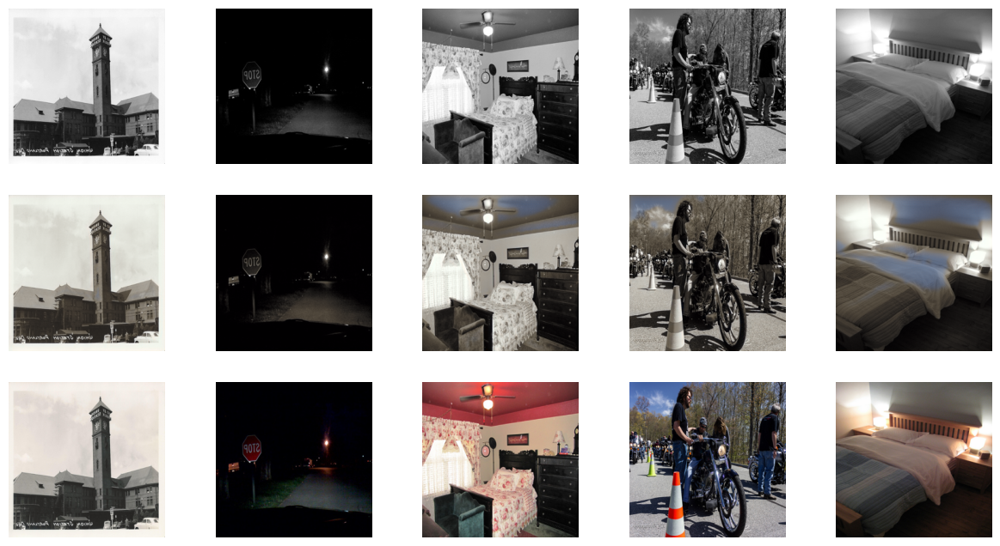

 80%|███████▉  | 399/500 [04:40<01:11,  1.42it/s]


Epoch 1/5
Iteration 400/500
loss_D_fake: 0.45211
loss_D_real: 0.45777
loss_D: 0.45494
loss_G_GAN: 1.72772
loss_G_L1: 9.09184
loss_G: 10.81955


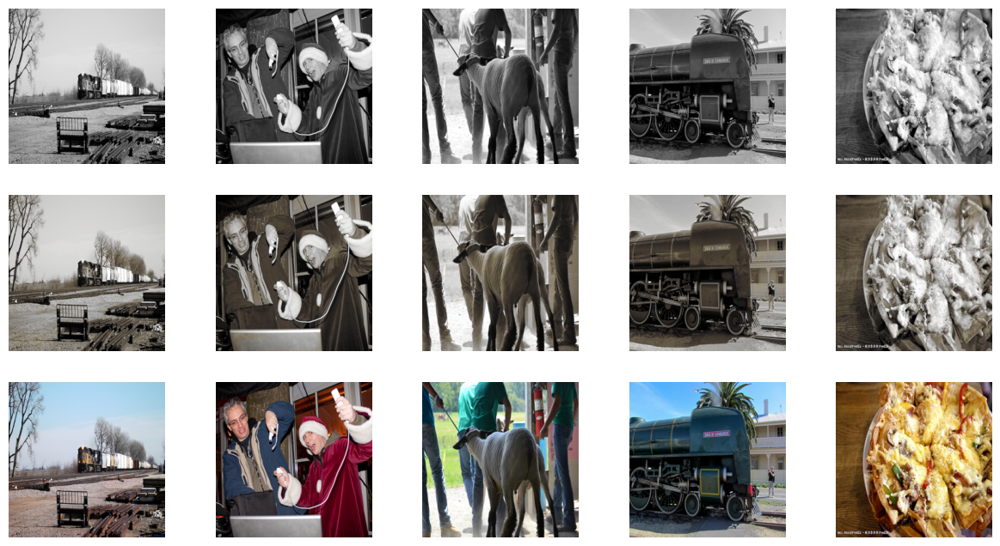

 40%|███▉      | 199/500 [02:20<03:30,  1.43it/s]


Epoch 2/5
Iteration 200/500
loss_D_fake: 0.34532
loss_D_real: 0.34698
loss_D: 0.34615
loss_G_GAN: 2.07005
loss_G_L1: 8.34526
loss_G: 10.41531


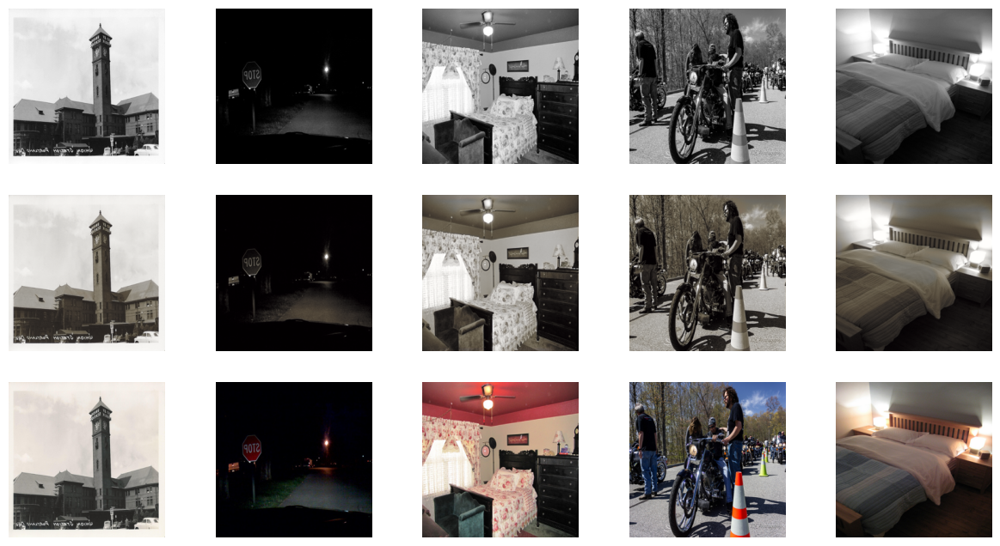

 80%|███████▉  | 399/500 [04:41<01:11,  1.42it/s]


Epoch 2/5
Iteration 400/500
loss_D_fake: 0.36826
loss_D_real: 0.36592
loss_D: 0.36709
loss_G_GAN: 2.05273
loss_G_L1: 8.60176
loss_G: 10.65449


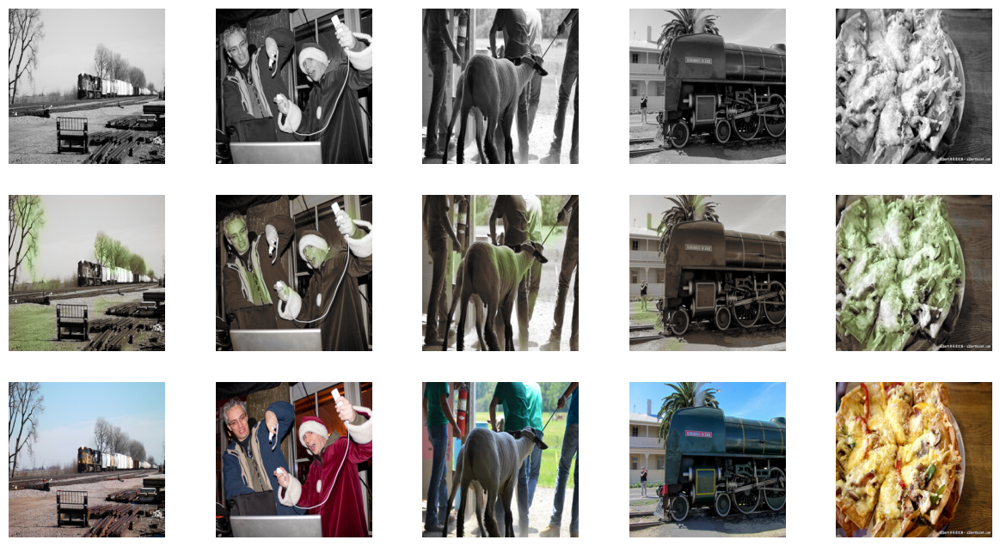

 40%|███▉      | 199/500 [02:20<03:30,  1.43it/s]


Epoch 3/5
Iteration 200/500
loss_D_fake: 0.47142
loss_D_real: 0.46237
loss_D: 0.46689
loss_G_GAN: 1.86385
loss_G_L1: 9.33187
loss_G: 11.19572


/home/sv-cheats-1/Documents/UI/PMLDL/Project/src/utils.py:86: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 8 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)


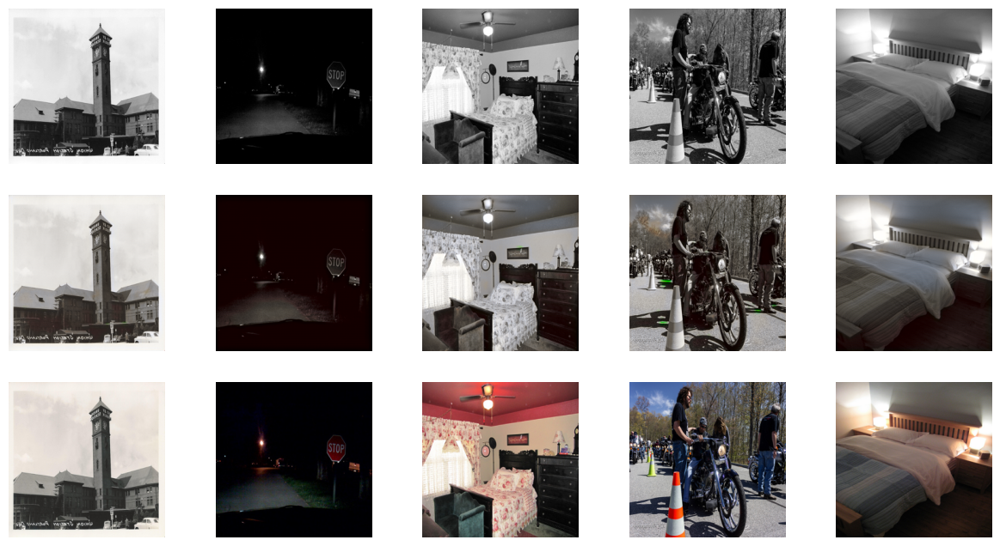

 80%|███████▉  | 399/500 [04:40<01:10,  1.43it/s]


Epoch 3/5
Iteration 400/500
loss_D_fake: 0.48689
loss_D_real: 0.46625
loss_D: 0.47657
loss_G_GAN: 1.82605
loss_G_L1: 11.05955
loss_G: 12.88560


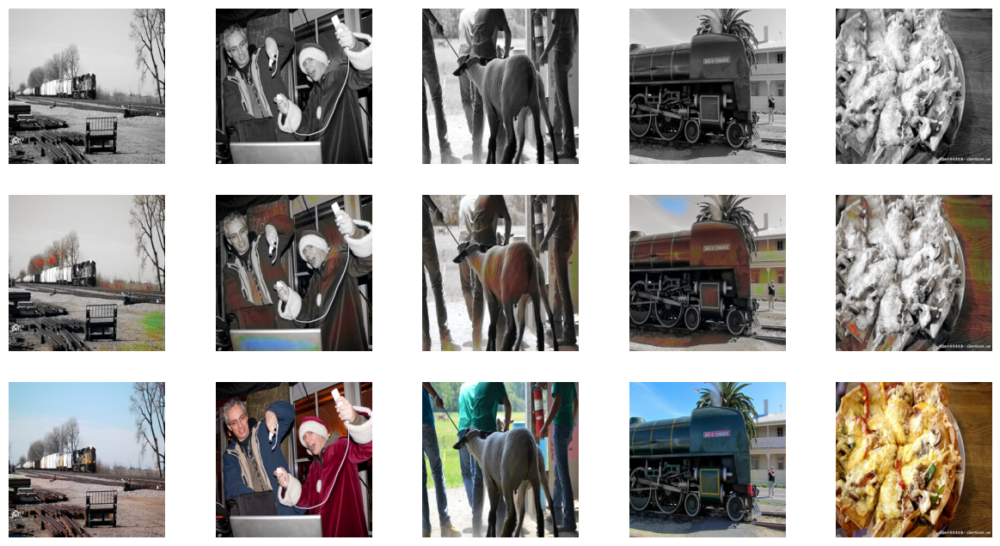

 40%|███▉      | 199/500 [02:19<03:31,  1.43it/s]


Epoch 4/5
Iteration 200/500
loss_D_fake: 0.51590
loss_D_real: 0.56617
loss_D: 0.54103
loss_G_GAN: 1.36006
loss_G_L1: 10.01806
loss_G: 11.37812


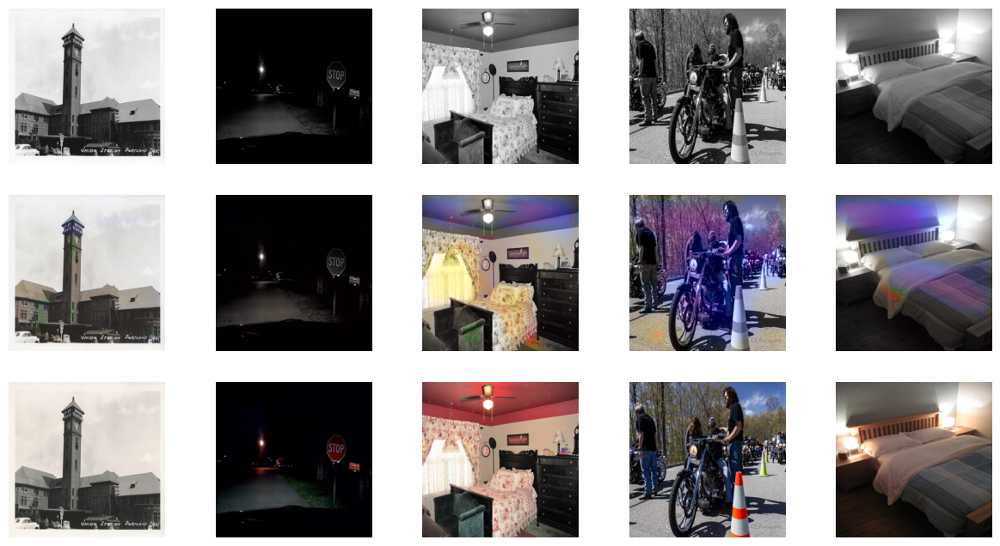

 80%|███████▉  | 399/500 [04:40<01:10,  1.43it/s]


Epoch 4/5
Iteration 400/500
loss_D_fake: 0.52751
loss_D_real: 0.57345
loss_D: 0.55048
loss_G_GAN: 1.32511
loss_G_L1: 10.23511
loss_G: 11.56022


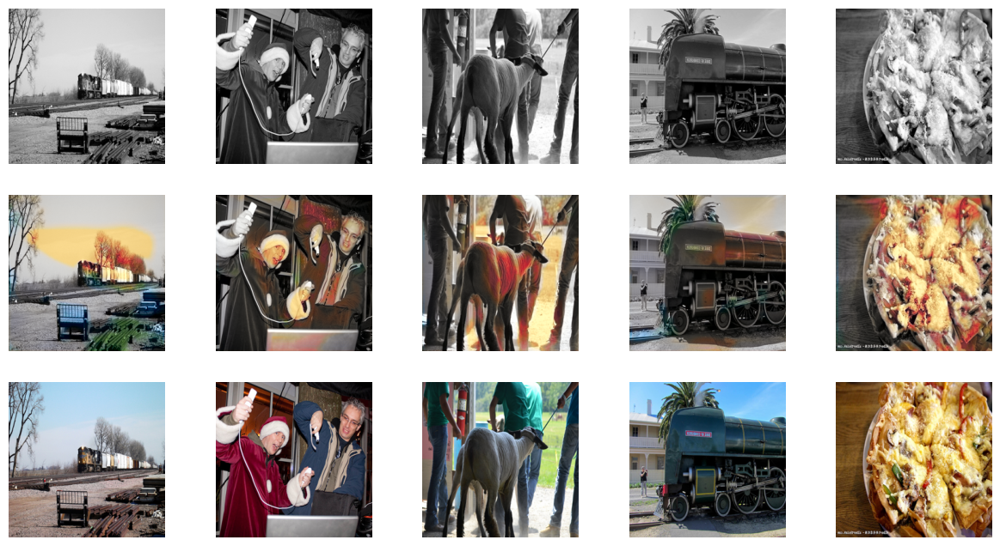

 40%|███▉      | 199/500 [02:19<03:30,  1.43it/s]


Epoch 5/5
Iteration 200/500
loss_D_fake: 0.53629
loss_D_real: 0.60724
loss_D: 0.57177
loss_G_GAN: 1.21127
loss_G_L1: 10.04064
loss_G: 11.25190


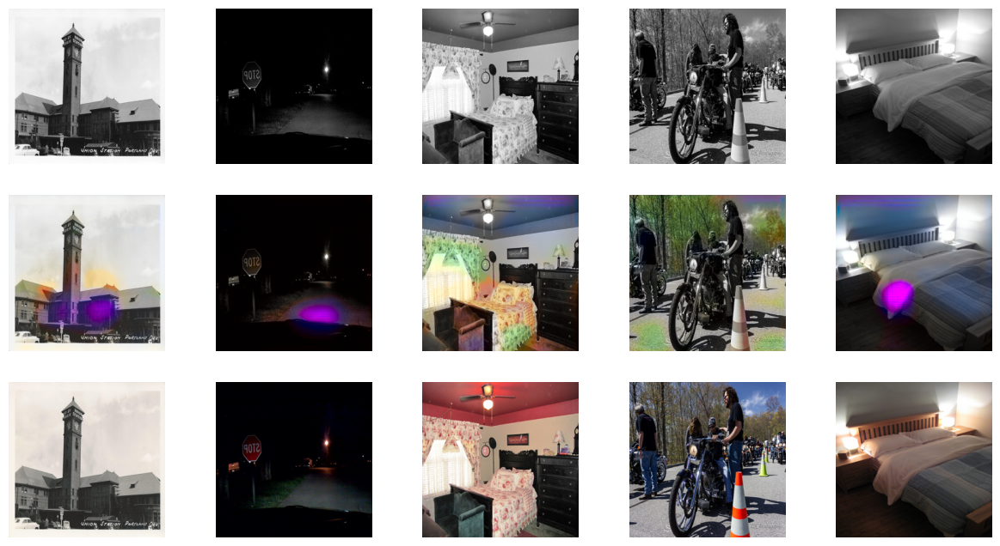

 80%|███████▉  | 399/500 [04:40<01:10,  1.43it/s]


Epoch 5/5
Iteration 400/500
loss_D_fake: 0.53851
loss_D_real: 0.61338
loss_D: 0.57595
loss_G_GAN: 1.19733
loss_G_L1: 10.16458
loss_G: 11.36190


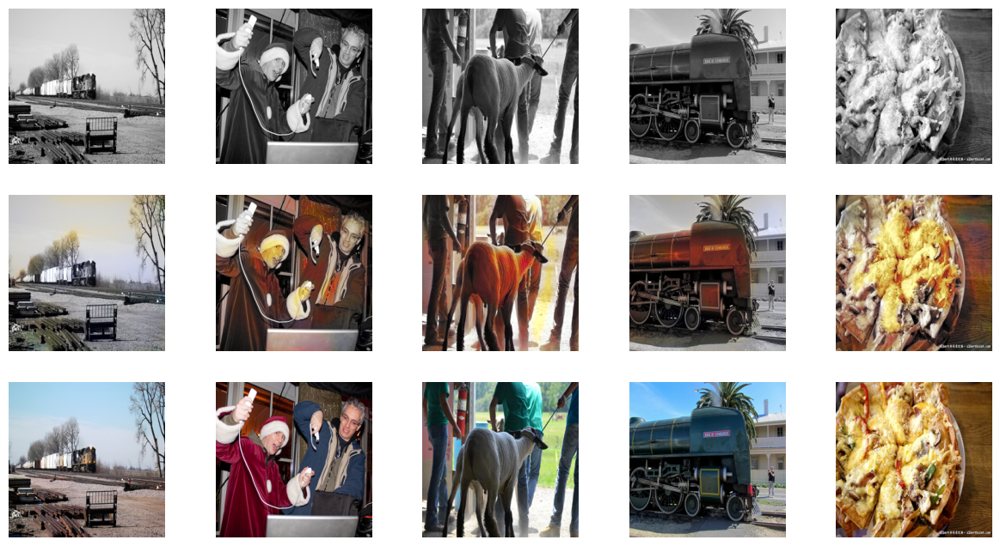

100%|██████████| 500/500 [05:51<00:00,  1.42it/s]


In [18]:
def train_model(model, train_dl, epochs, display_every=200):
    # data = next(iter(val_dl)) 
    for itr in range(epochs):
        loss_meter_dict = create_loss_meters() 
        i = 0                                  
        for data in tqdm(train_dl):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) 
            i += 1
            if i % display_every == 0:
                print(f"\nEpoch {itr+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")
                log_results(loss_meter_dict) 
                visualize(model, data, save=False) 

model = Model(G_net=G_net, lr_G=0.0004, lr_D=0.0004, beta1=0.5, beta2=0.999, lamda=100.)
train_model(model, train_dl, num_epochs)

In [20]:
torch.save(model.state_dict(), "model.pt")